In [2]:
import pandas as pd
import numpy as np
import umap
from sklearn.decomposition import PCA
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_samples, silhouette_score
import seaborn as sns
import matplotlib.pyplot as plt

/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# read in embeddings
embedding_df_with_label = pd.read_csv('output/dms/embeddings/jones_esm1b_t33_650M_UR50S.csv')
embedding_df = embedding_df_with_label.iloc[:, 1:]

In [4]:
# PCA
pca = PCA(n_components=10)
pca_embeddings = pca.fit_transform(embedding_df)

# convert to dataframe
pca_df = pd.DataFrame(pca_embeddings, columns=[f'PC{i+1}' for i in range(pca_embeddings.shape[1])])

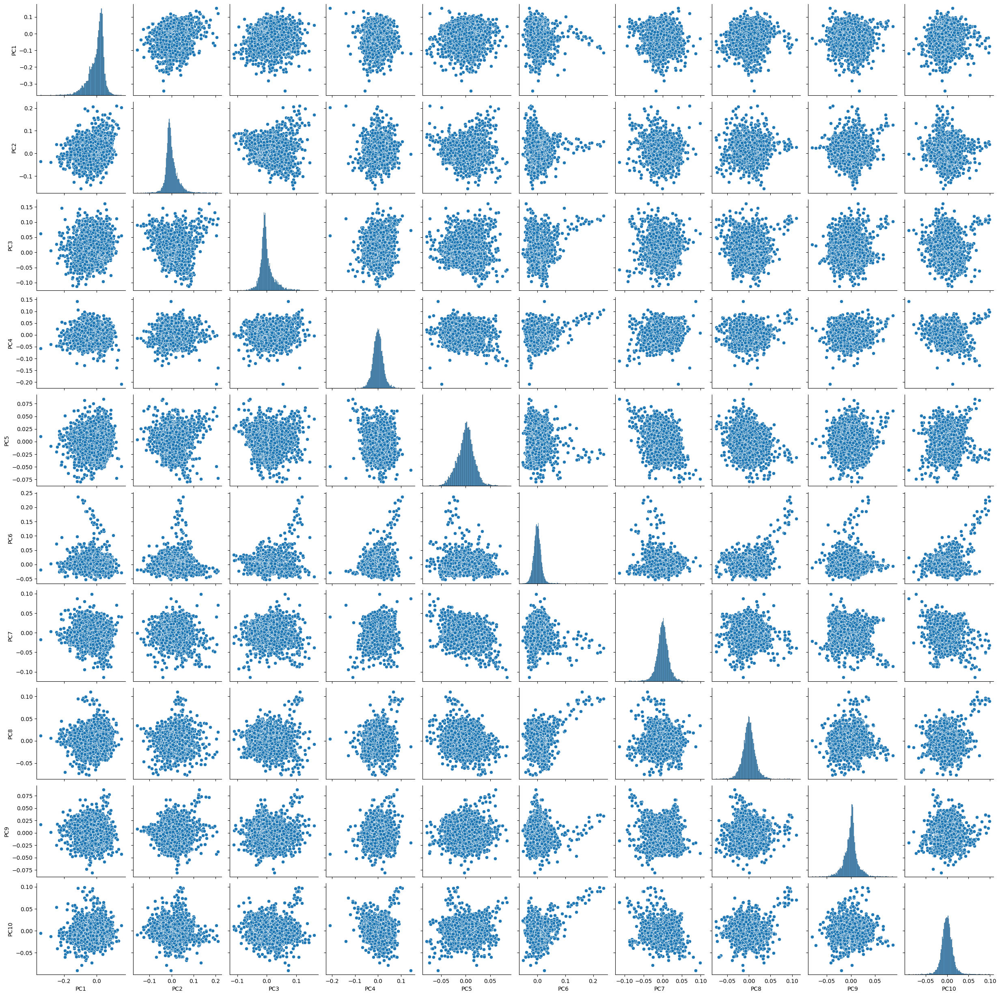

In [8]:
sns.pairplot(pca_df)

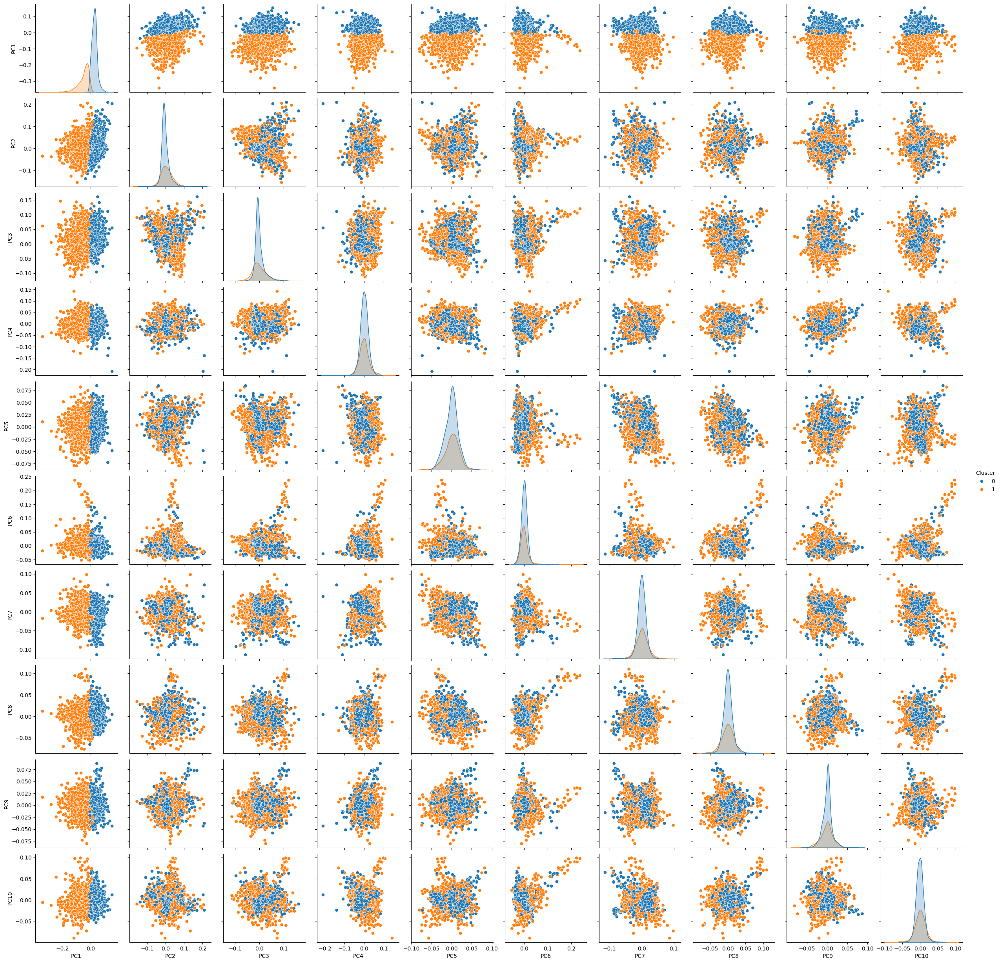

In [5]:
# perform K-medoids cluster on PCA embeddings
clusters = KMedoids(n_clusters = 2, metric='euclidean', random_state=42).fit(pca_embeddings)
pca_df['Cluster'] = clusters.labels_
sns.pairplot(pca_df, hue="Cluster")

In [10]:
# calculate silhouette scores
silhouette_vals = silhouette_samples(pca_embeddings, clusters.labels_)
avg_silhouette_score = silhouette_score(pca_embeddings, clusters.labels_)
print(f"Average silhouette score: {avg_silhouette_score:.2f}")

Average silhouette score: 0.29


In [11]:
for i in range(2, 10):
    clusters = KMedoids(n_clusters = i, metric='euclidean', random_state=42).fit(pca_embeddings)
    silhouette_vals = silhouette_samples(pca_embeddings, clusters.labels_)
    avg_silhouette_score = silhouette_score(pca_embeddings, clusters.labels_)
    print(f"Average silhouette score: {avg_silhouette_score:.2f}")

Average silhouette score: 0.29
Average silhouette score: 0.13
Average silhouette score: 0.07
Average silhouette score: 0.09
Average silhouette score: 0.06
Average silhouette score: 0.03
Average silhouette score: 0.04
Average silhouette score: 0.03


<Axes: ylabel='Silhouette'>

/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


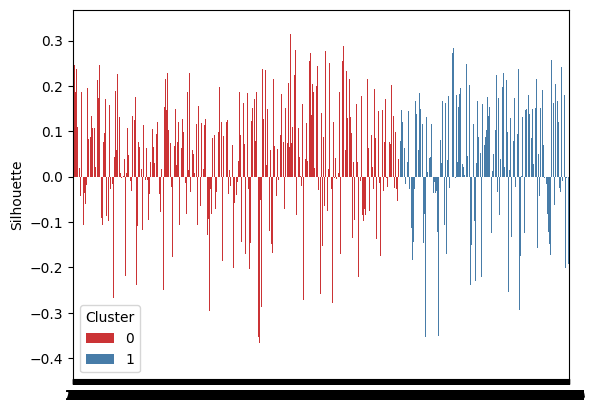

In [12]:
# plotting silhouette plot
pca_df['Silhouette'] = silhouette_vals
silhouette_plot_df = pca_df.sort_values(by='Cluster')
sns.barplot(
    x=np.arange(len(silhouette_plot_df)),
    y=silhouette_plot_df['Silhouette'],
    hue=silhouette_plot_df['Cluster'],
    dodge=False,
    palette='Set1'
)

In [6]:
# plotting pca by activity threshold
activity_df = pd.read_csv('output/dms/labels/jones_labels.csv')

# alterative: plotting based on lowest activity
lowest_decile = activity_df['activity_scaled'].quantile(0.1) # lowest 10 centiles
activity_df['low_activity_binary'] = (activity_df['activity_scaled'] <= lowest_decile).astype(int)

embedding_df_with_label = pd.read_csv('output/dms/embeddings/jones_esm1b_t33_650M_UR50S.csv')
embedding_df_with_label['activity_binary'] = 0
for index, row in embedding_df_with_label.iterrows():
    mutation = row[0]
    activity = activity_df.loc[activity_df['variant'] == mutation, 'low_activity_binary'].iloc[0]
    embedding_df_with_label.loc[index, 'activity_binary'] = activity

/var/folders/dh/zkvslqlx7yjcsf3ltw4jvr_m0000gn/T/ipykernel_30291/196092883.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  mutation = row[0]
/var/folders/dh/zkvslqlx7yjcsf3ltw4jvr_m0000gn/T/ipykernel_30291/196092883.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  mutation = row[0]
/var/folders/dh/zkvslqlx7yjcsf3ltw4jvr_m0000gn/T/ipykernel_30291/196092883.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  mutation = row[0

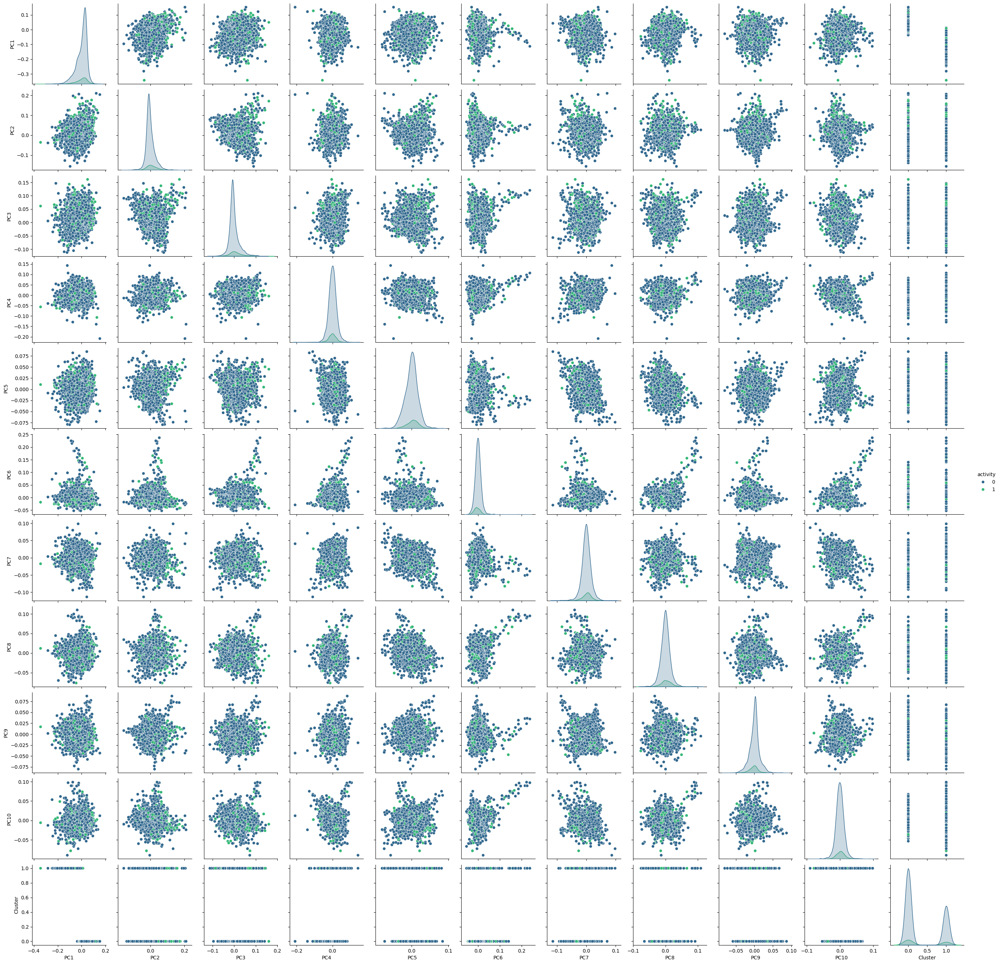

In [8]:
pca_df['activity'] = embedding_df_with_label['activity_binary']
sns.pairplot(pca_df, hue='activity', 
             vars=pca_df.columns[:-1],
             palette='viridis'
             )

In [15]:
# umap
umap = umap.UMAP(n_components=10, random_state=42)
umap_embeddings = umap.fit_transform(embedding_df)

# convert to dataframe
umap_df = pd.DataFrame(umap_embeddings, columns=[f'UMAP{i+1}' for i in range(umap_embeddings.shape[1])])

/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


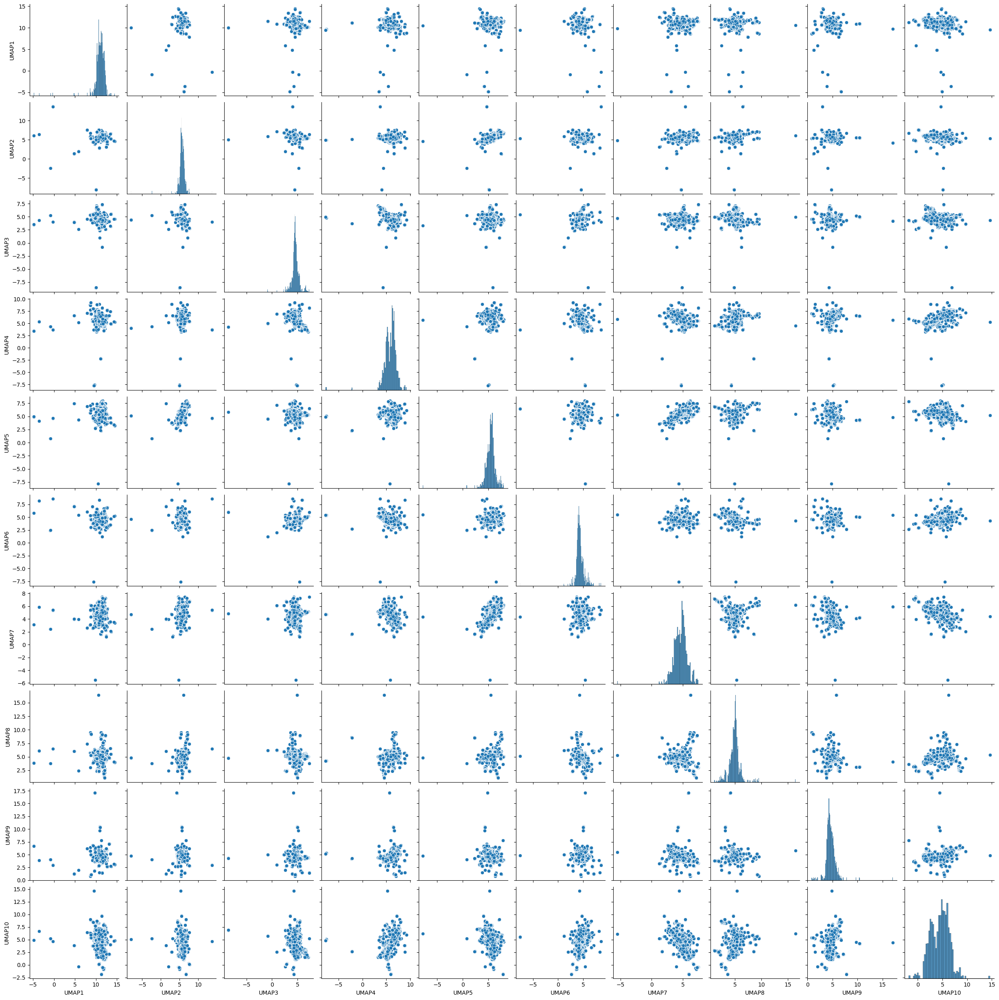

In [16]:
sns.pairplot(umap_df)

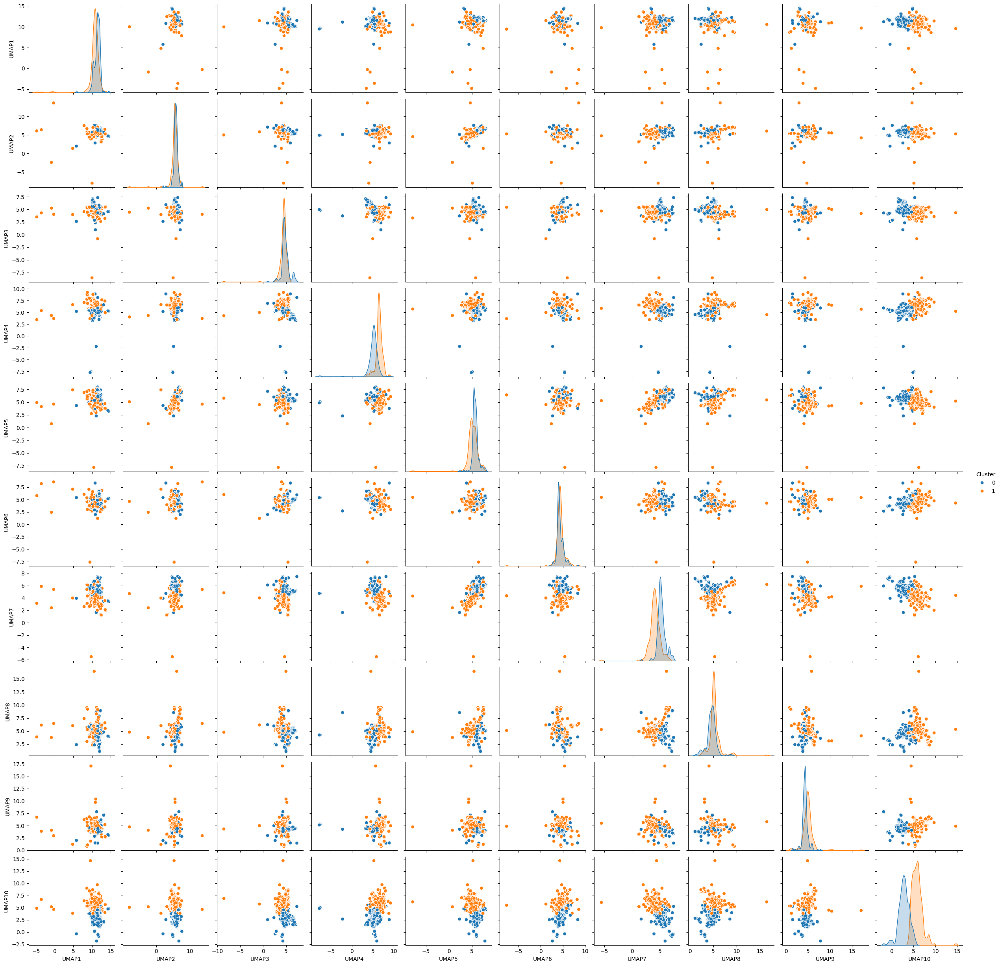

In [17]:
# perform K-medoids cluster on UMAP embeddings
clusters = KMedoids(n_clusters = 2, metric='euclidean', random_state=42).fit(umap_embeddings)
umap_df['Cluster'] = clusters.labels_
sns.pairplot(umap_df, hue="Cluster")

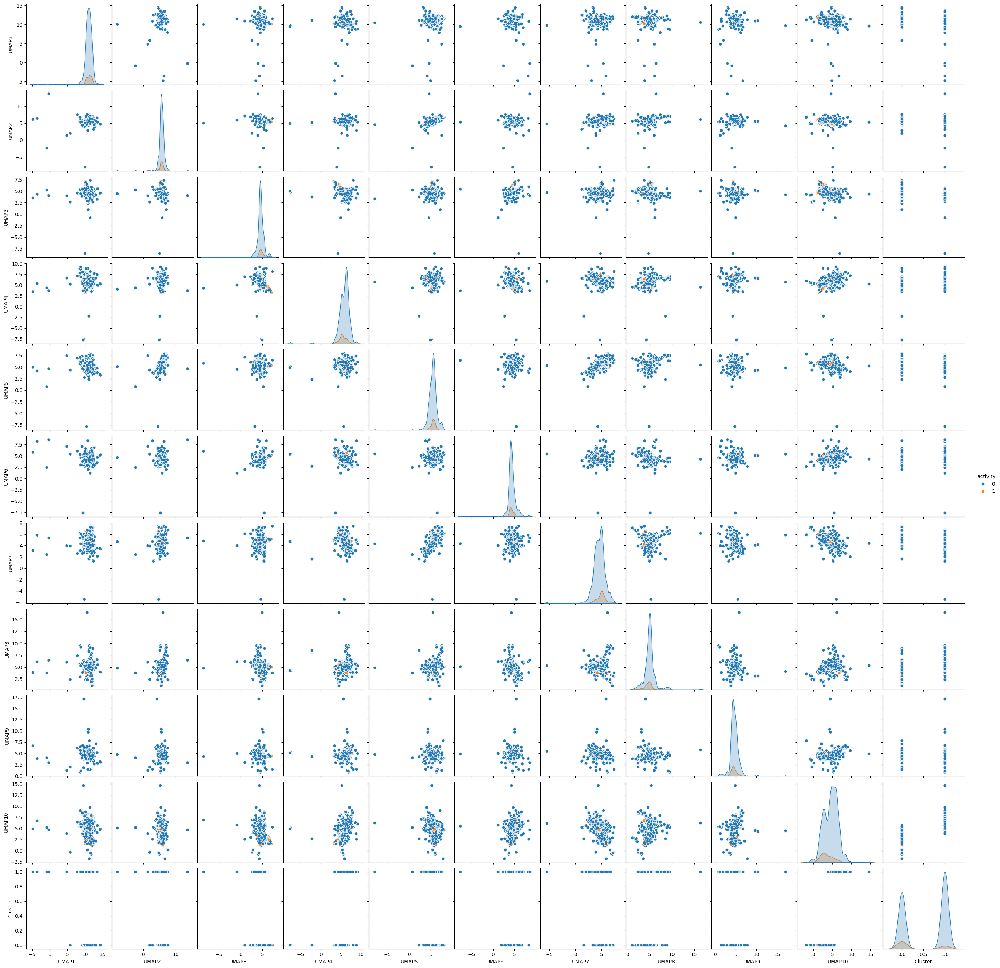

In [18]:
umap_df['activity'] = embedding_df_with_label['activity_binary']
sns.pairplot(umap_df, hue="activity")